## Importing Libraries

In [ ]:
from __future__ import absolute_import, division, print_function, unicode_literals
import tensorflow as tf


import sys
!{sys.executable} -m pip install git+https://github.com/nottombrown/imagenet_stubs
sys.path.append("..")

%matplotlib inline

tf.compat.v1.disable_eager_execution()

import imagenet_stubs
import numpy as np
import tensorflow.keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model
import tensorflow.keras.backend as k
from matplotlib import pyplot as plt
from IPython.display import clear_output, Image, display
import cv2

from art.estimators.classification import KerasClassifier
from art.attacks.evasion import HopSkipJump
from art.utils import to_categorical

from PIL import Image
import matplotlib.image as mpimg

  Cloning https://github.com/nottombrown/imagenet_stubs to /tmp/pip-req-build-oyj8ixvt
  Running command git clone --filter=blob:none -q https://github.com/nottombrown/imagenet_stubs /tmp/pip-req-build-oyj8ixvt
  Resolved https://github.com/nottombrown/imagenet_stubs to commit 0b501276f54cbf45b8e1b67dccbdcbe51de88365
  Preparing metadata (setup.py) ... done


/home/romi/anaconda3/envs/mhashir/lib/python3.6/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/romi/anaconda3/envs/mhashir/lib/python3.6/site-packages/art/estimators/certification/__init__.py:28: UserWarning: PyTorch not found. Not importing DeepZ or Interval Bound Propagation functionality
  warnings.warn("PyTorch not found. Not importing DeepZ or Interval Bound Propagation functionality")


### Part 1: Getting Similarity Score of Pairs of Images

In [ ]:
def sift_feature_matching(img1_path, img2_path, threshold=0.7, ransac_threshold=3.0):
    # Load the images
    img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)
    img2 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)

    # Initialize SIFT detector
    sift = cv2.SIFT_create()

    # Detect and compute keypoints and descriptors
    keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

    # Initialize a brute-force matcher
    bf = cv2.BFMatcher()

    # Match descriptors
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)

    # Apply ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < threshold * n.distance:
            good_matches.append(m)

    # Convert keypoints to points
    src_pts = [keypoints1[m.queryIdx].pt for m in good_matches]
    dst_pts = [keypoints2[m.trainIdx].pt for m in good_matches]

    # Perform RANSAC for robustness
    if len(src_pts) >= 4:
        src_pts = np.float32(src_pts).reshape(-1, 1, 2)
        dst_pts = np.float32(dst_pts).reshape(-1, 1, 2)

        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_threshold)
        mask_matches = mask.ravel().tolist()
        num_matches = sum(mask_matches)
    else:
        num_matches = 0

    return num_matches

In [ ]:
def match(img1_path, img2_path, threshold=0.7, ransac_threshold=3.0):
    # Load the images
    img1 = cv2.cvtColor(img1_path[0].astype(np.uint8), cv2.COLOR_RGB2GRAY)
    img2 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)

    # Initialize SIFT detector
    sift = cv2.SIFT_create()

    # Detect and compute keypoints and descriptors
    keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

    # Initialize a brute-force matcher
    bf = cv2.BFMatcher()

    # Match descriptors
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)

    # Apply ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < threshold * n.distance:
            good_matches.append(m)

    # Convert keypoints to points
    src_pts = [keypoints1[m.queryIdx].pt for m in good_matches]
    dst_pts = [keypoints2[m.trainIdx].pt for m in good_matches]

    # Perform RANSAC for robustness
    if len(src_pts) >= 4:
        src_pts = np.float32(src_pts).reshape(-1, 1, 2)
        dst_pts = np.float32(dst_pts).reshape(-1, 1, 2)

        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_threshold)
        mask_matches = mask.ravel().tolist()
        num_matches = sum(mask_matches)
    else:
        num_matches = 0

    print("No. of Features Matched: ", num_matches)

    return num_matches

### Different Images

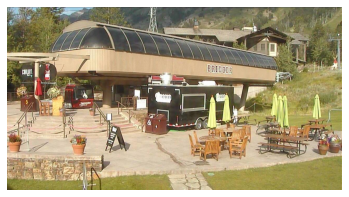

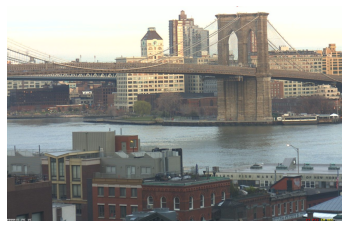

No. of Features Matched:  6


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_bridger/1.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_brooklyn/1.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))


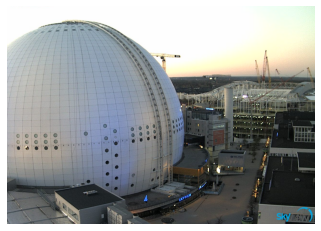

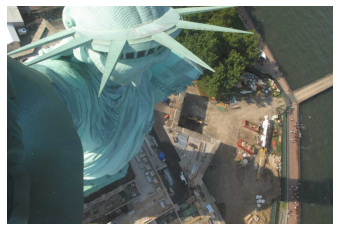

No. of Features Matched:  5


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_dome/1.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_crownnight/1.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))


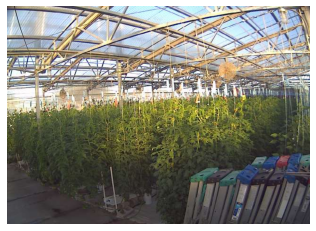

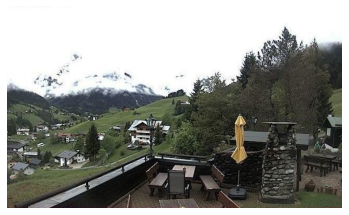

No. of Features Matched:  6


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_greenhouse/1.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_gonnenberg/1.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))


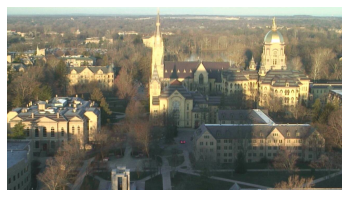

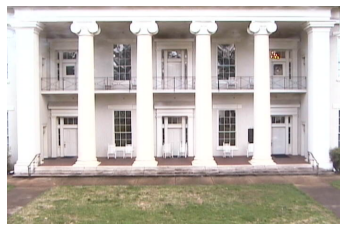

No. of Features Matched:  6


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_indiana/1.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_kions/1.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))


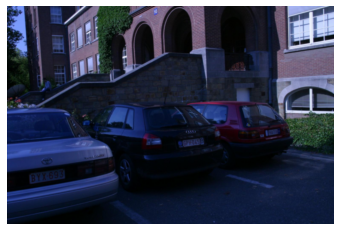

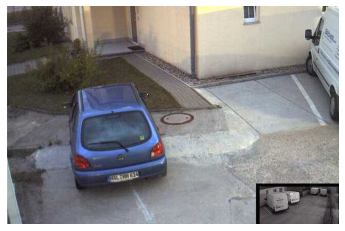

No. of Features Matched:  4


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_leuven/2.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_parking/1.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))


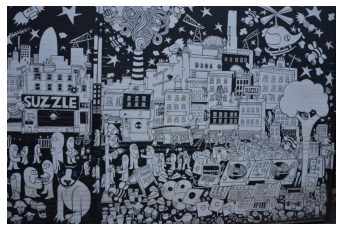

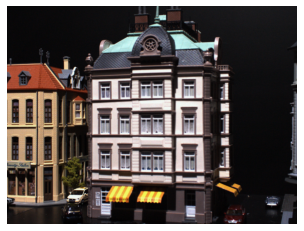

No. of Features Matched:  7


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_cartooncity/1.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_yellowtent/1.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))


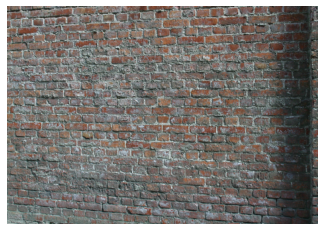

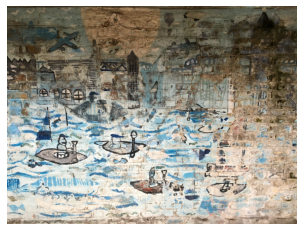

No. of Features Matched:  0


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_bricks/1.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_busstop/1.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))


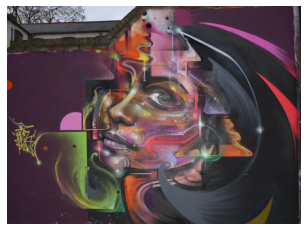

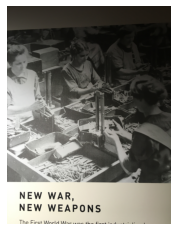

No. of Features Matched:  4


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_woman/1.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_weapons/1.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))


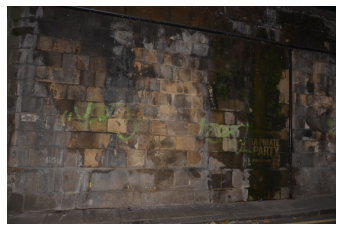

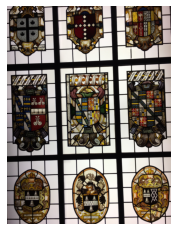

No. of Features Matched:  0


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_wall/1.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_vitro/1.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))


### Getting Lower Bound of the Score

In [ ]:
different_images_score = []

In [ ]:
different_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_bologna/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_books/1.ppm"))
different_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_bridger/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_brooklyn/1.ppm"))
different_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_dome/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_crownnight/1.ppm"))
different_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_greenhouse/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_gonnenberg/1.ppm"))
different_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_indiana/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_kions/1.ppm"))
different_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_leuven/2.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_parking/1.ppm"))
different_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_cartooncity/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_yellowtent/1.ppm"))
different_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_bricks/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_busstop/1.ppm"))
different_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_woman/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_weapons/1.ppm"))
different_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_wall/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_vitro/1.ppm"))


In [ ]:
lower_bound = (sum(different_images_score))/(len(different_images_score))
print(lower_bound)

3.8


### Paart 2: Increasing NoFM of Different Images

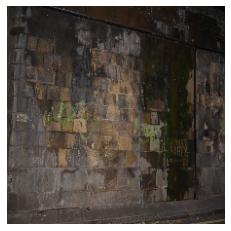

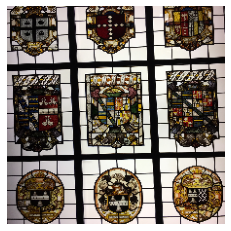

No. Of Matched Features:  0


In [ ]:
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_wall/1.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()


target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_vitro/1.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

print("No. Of Matched Features: ", sift_feature_matching(init_image_path, target_image_name))

initial_prediction:  prison


HopSkipJump: 100%|██████████| 1/1 [00:00<00:00, 1366.22it/s]

Adversarial image at step 0. L2 error 42517.38 and class label 743.
I think this is a:  prison


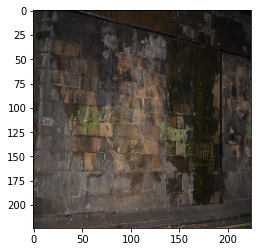

No. of Features Matched:  40


HopSkipJump: 100%|██████████| 1/1 [00:15<00:00, 15.78s/it]


Adversarial image at step 10. L2 error 38762.293 and class label 743.
I think this is a:  prison


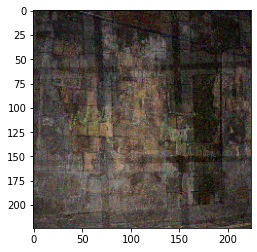

No. of Features Matched:  4


HopSkipJump: 100%|██████████| 1/1 [00:20<00:00, 20.67s/it]


Adversarial image at step 20. L2 error 34086.707 and class label 743.
I think this is a:  prison


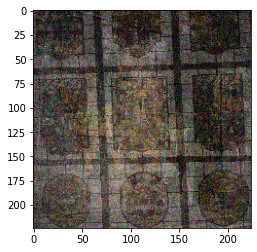

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:24<00:00, 24.61s/it]


Adversarial image at step 30. L2 error 27332.146 and class label 743.
I think this is a:  prison


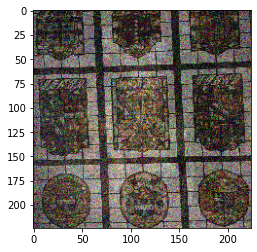

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:27<00:00, 27.47s/it]


Adversarial image at step 40. L2 error 22750.22 and class label 743.
I think this is a:  prison


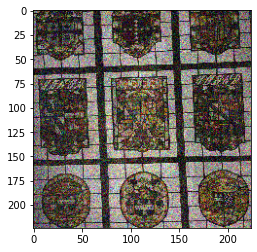

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:29<00:00, 30.00s/it]


Adversarial image at step 50. L2 error 17736.271 and class label 743.
I think this is a:  prison


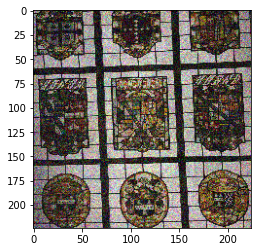

No. of Features Matched:  4


HopSkipJump: 100%|██████████| 1/1 [00:32<00:00, 32.39s/it]


Adversarial image at step 60. L2 error 14188.878 and class label 743.
I think this is a:  prison


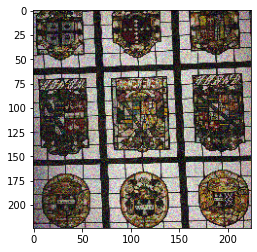

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:35<00:00, 35.37s/it]


Adversarial image at step 70. L2 error 11466.886 and class label 743.
I think this is a:  prison


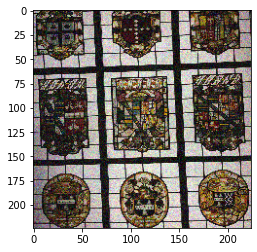

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:37<00:00, 37.10s/it]


Adversarial image at step 80. L2 error 9441.399 and class label 743.
I think this is a:  prison


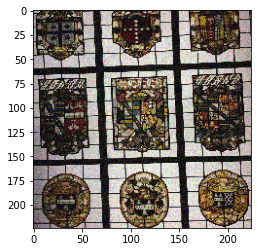

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:38<00:00, 38.81s/it]


Adversarial image at step 90. L2 error 8191.588 and class label 743.
I think this is a:  prison


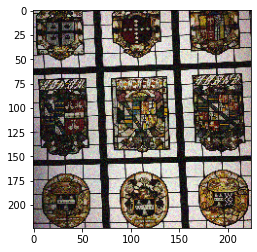

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:41<00:00, 41.22s/it]


Adversarial image at step 100. L2 error 7138.242 and class label 743.
I think this is a:  prison


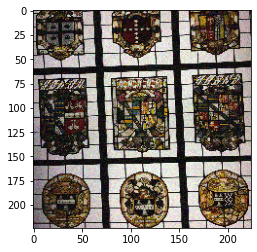

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:42<00:00, 42.60s/it]


Adversarial image at step 110. L2 error 6261.1094 and class label 743.
I think this is a:  prison


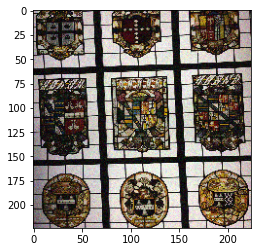

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:44<00:00, 44.09s/it]


Adversarial image at step 120. L2 error 5581.15 and class label 743.
I think this is a:  prison


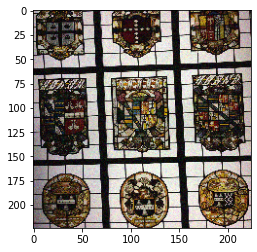

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:45<00:00, 45.52s/it]


Adversarial image at step 130. L2 error 5043.183 and class label 743.
I think this is a:  prison


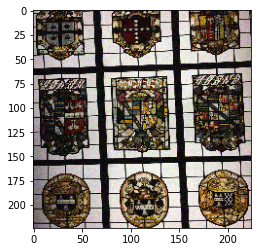

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:48<00:00, 48.41s/it]


Adversarial image at step 140. L2 error 4679.9966 and class label 743.
I think this is a:  prison


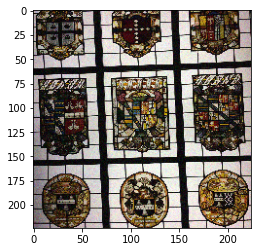

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:51<00:00, 51.89s/it]


Adversarial image at step 150. L2 error 4307.9272 and class label 743.
I think this is a:  prison


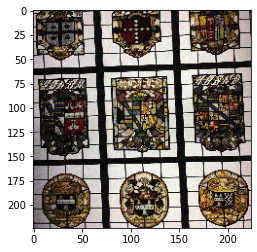

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:54<00:00, 54.31s/it]


Adversarial image at step 160. L2 error 4000.9038 and class label 743.
I think this is a:  prison


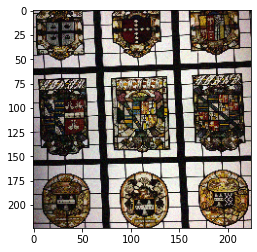

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:57<00:00, 57.04s/it]


Adversarial image at step 170. L2 error 3724.6426 and class label 743.
I think this is a:  prison


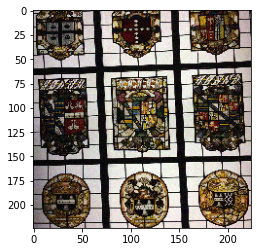

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:57<00:00, 57.77s/it]


Adversarial image at step 180. L2 error 3496.0972 and class label 743.
I think this is a:  prison


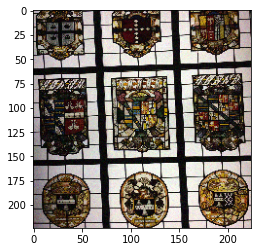

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:56<00:00, 56.90s/it]


Adversarial image at step 190. L2 error 3306.2249 and class label 743.
I think this is a:  prison


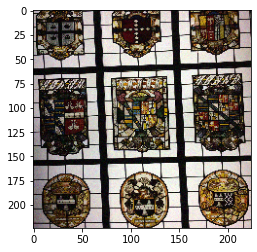

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [01:02<00:00, 62.24s/it]


Adversarial image at step 200. L2 error 3126.4456 and class label 743.
I think this is a:  prison


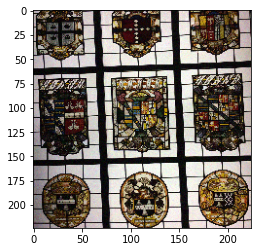

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [01:03<00:00, 63.16s/it]


Adversarial image at step 210. L2 error 2987.0327 and class label 743.
I think this is a:  prison


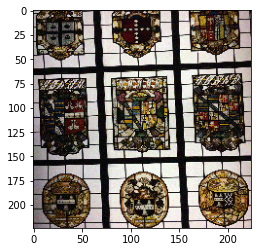

No. of Features Matched:  0


HopSkipJump:   0%|          | 0/1 [00:16<?, ?it/s]


KeyboardInterrupt: 

In [ ]:
with tf.device('/GPU:0'):

    attack = HopSkipJump(classifier=classifier, targeted=True, max_iter=0, max_eval=1000, init_eval=10)
    iter_step = 10

    x_adv = np.array([init_image])

    pred = classifier.predict(x_adv)

    #get initial label for HopSkip to compare
    initial_label = np.argmax(pred[0])

    print("initial_prediction: ",decode_predictions(pred, top=1)[0][0][1])

    i=0

    while True:
        x_adv = attack.generate(x=np.array([target_image]), y=to_categorical([initial_label], 1000), x_adv_init=x_adv, resume=True)

        #clear_output()
        pred = classifier.predict(x_adv)
        print("Adversarial image at step %d." % (i * iter_step), "L2 error",
              np.linalg.norm(np.reshape(x_adv[0] - target_image, [-1])),
              "and class label %d." % np.argmax(pred[0]))
        print("I think this is a: ",decode_predictions(pred, top=1)[0][0][1])
        plt.imshow(x_adv[0].astype(np.uint))
        plt.show(block=False)

        attack.max_iter = iter_step

#         print(match(x_adv, init_image_path))

        if(match(x_adv, init_image_path) >=15 and i>=10):
            break

        i+=1

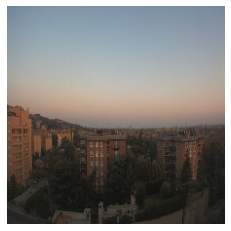

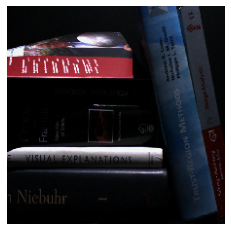

No. Of Matched Features:  0


In [ ]:
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_bologna/1.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()


target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_books/1.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

print("No. Of Matched Features: ", sift_feature_matching(init_image_path, target_image_name))

initial_prediction:  monitor


HopSkipJump: 100%|██████████| 1/1 [00:00<00:00, 1377.44it/s]

Adversarial image at step 0. L2 error 41401.17 and class label 664.
I think this is a:  monitor


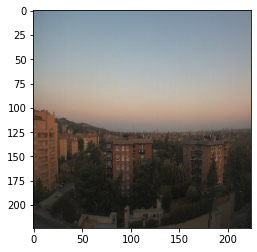

No. of Features Matched:  17


HopSkipJump: 100%|██████████| 1/1 [00:19<00:00, 19.52s/it]


Adversarial image at step 10. L2 error 34366.36 and class label 664.
I think this is a:  monitor


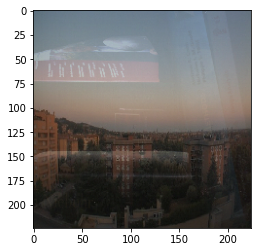

No. of Features Matched:  6


HopSkipJump: 100%|██████████| 1/1 [00:26<00:00, 26.03s/it]


Adversarial image at step 20. L2 error 34352.434 and class label 664.
I think this is a:  monitor


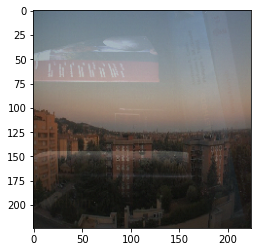

No. of Features Matched:  5


HopSkipJump: 100%|██████████| 1/1 [00:28<00:00, 28.98s/it]


Adversarial image at step 30. L2 error 34124.797 and class label 664.
I think this is a:  monitor


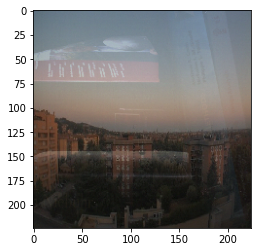

No. of Features Matched:  8


HopSkipJump: 100%|██████████| 1/1 [00:33<00:00, 33.50s/it]


Adversarial image at step 40. L2 error 34019.42 and class label 664.
I think this is a:  monitor


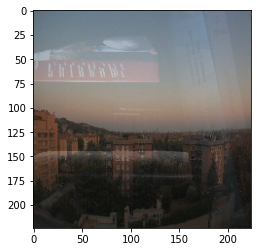

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:34<00:00, 34.35s/it]


Adversarial image at step 50. L2 error 32423.906 and class label 664.
I think this is a:  monitor


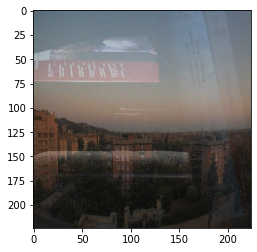

No. of Features Matched:  5


HopSkipJump: 100%|██████████| 1/1 [00:35<00:00, 35.07s/it]


Adversarial image at step 60. L2 error 28930.377 and class label 664.
I think this is a:  monitor


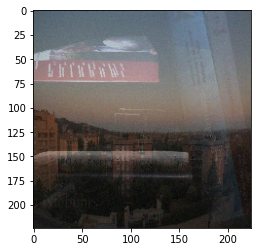

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:37<00:00, 37.18s/it]


Adversarial image at step 70. L2 error 18970.346 and class label 664.
I think this is a:  monitor


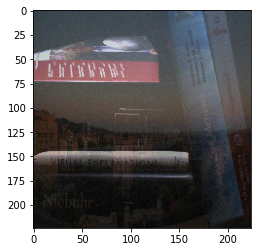

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:39<00:00, 39.74s/it]


Adversarial image at step 80. L2 error 13029.498 and class label 664.
I think this is a:  monitor


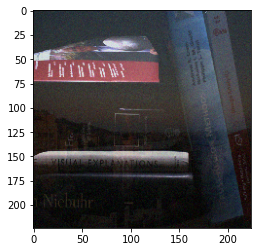

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:40<00:00, 40.43s/it]


Adversarial image at step 90. L2 error 5925.0947 and class label 664.
I think this is a:  monitor


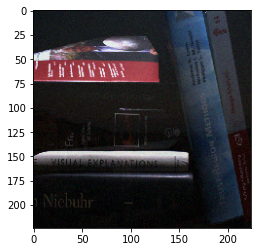

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:42<00:00, 42.40s/it]


Adversarial image at step 100. L2 error 3473.8672 and class label 664.
I think this is a:  monitor


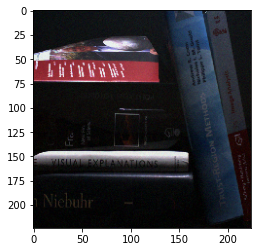

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:44<00:00, 44.06s/it]


Adversarial image at step 110. L2 error 2195.7776 and class label 664.
I think this is a:  monitor


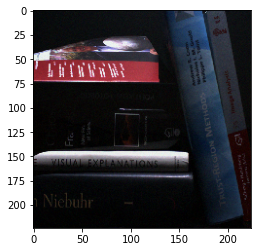

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:46<00:00, 46.82s/it]


Adversarial image at step 120. L2 error 1594.9747 and class label 664.
I think this is a:  monitor


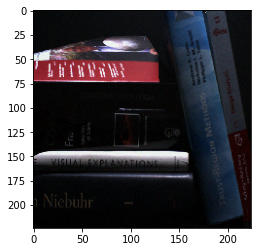

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:47<00:00, 47.80s/it]


Adversarial image at step 130. L2 error 1265.5242 and class label 664.
I think this is a:  monitor


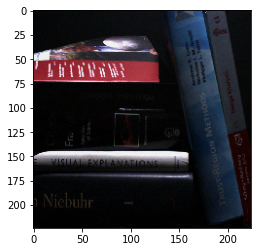

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:49<00:00, 49.35s/it]


Adversarial image at step 140. L2 error 966.5896 and class label 664.
I think this is a:  monitor


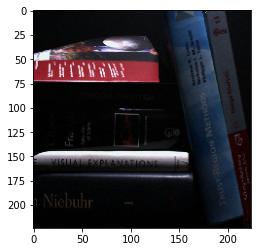

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:50<00:00, 50.87s/it]


Adversarial image at step 150. L2 error 776.65857 and class label 664.
I think this is a:  monitor


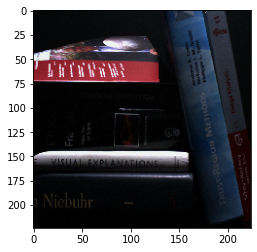

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:52<00:00, 52.28s/it]


Adversarial image at step 160. L2 error 632.1634 and class label 664.
I think this is a:  monitor


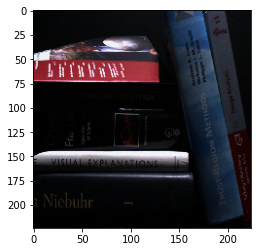

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:53<00:00, 53.83s/it]


Adversarial image at step 170. L2 error 536.24915 and class label 664.
I think this is a:  monitor


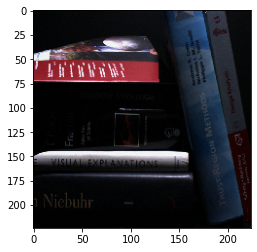

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:54<00:00, 54.92s/it]


Adversarial image at step 180. L2 error 470.906 and class label 664.
I think this is a:  monitor


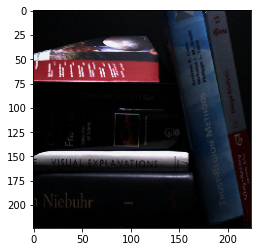

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:56<00:00, 56.15s/it]


Adversarial image at step 190. L2 error 414.42517 and class label 664.
I think this is a:  monitor


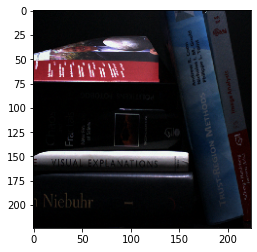

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:56<00:00, 56.97s/it]


Adversarial image at step 200. L2 error 375.42358 and class label 664.
I think this is a:  monitor


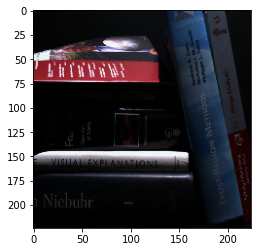

No. of Features Matched:  0


HopSkipJump:   0%|          | 0/1 [00:41<?, ?it/s]


KeyboardInterrupt: 

In [ ]:
with tf.device('/GPU:0'):

    attack = HopSkipJump(classifier=classifier, targeted=True, max_iter=0, max_eval=1000, init_eval=10)
    iter_step = 10

    x_adv = np.array([init_image])

    pred = classifier.predict(x_adv)

    #get initial label for HopSkip to compare
    initial_label = np.argmax(pred[0])

    print("initial_prediction: ",decode_predictions(pred, top=1)[0][0][1])

    i=0

    while True:
        x_adv = attack.generate(x=np.array([target_image]), y=to_categorical([initial_label], 1000), x_adv_init=x_adv, resume=True)

        #clear_output()
        pred = classifier.predict(x_adv)
        print("Adversarial image at step %d." % (i * iter_step), "L2 error",
              np.linalg.norm(np.reshape(x_adv[0] - target_image, [-1])),
              "and class label %d." % np.argmax(pred[0]))
        print("I think this is a: ",decode_predictions(pred, top=1)[0][0][1])
        plt.imshow(x_adv[0].astype(np.uint))
        plt.show(block=False)

        attack.max_iter = iter_step

#         print(match(x_adv, init_image_path))

        if(match(x_adv, init_image_path) >=15 and i>=10):
            break

        i+=1